In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [46]:
import abc
import pandas as pd
import yfinance as yf
import numpy as np

In [59]:
from transforms import (
    Composite, 
    DateFilter, 
    LogScaler, 
    LiquidityFilter, 
    AppendMid, 
    AppendTau, 
    DropElse,
    ReComp,
)

from vanilla_options import load_vanilla_options_dataframes

In [5]:
database = "SPX"
params = {
    "ticker": r"^SPX",
    "date": "2024-02-01",
    "period": "1d",
}
input_encoder = Composite(
    [
        DateFilter(),
        AppendTau(),
        AppendMid(),
        LogScaler(),
        LiquidityFilter(),
        DropElse(),
    ]
)
output_encoder = False
verbose = False


calls, puts, _ = load_vanilla_options_dataframes(
                    database, 
                    params, 
                    input_encoder, 
                    output_encoder, 
                    verbose,
                )  

In [27]:
from synthesizer import (
    synthesize_vanilla_options_data, 
    synthesize_vanilla_options_smile, 
    synthesize_vanilla_options_surface,
    synthesize_vanilla_options_optim_data
) 


In [40]:
n_samples_data: int = 5*10**5
input_encoder = ReComp()
output_encoder = LogScaler()
verbose: bool = False

samples = synthesize_vanilla_options_data(
    n_samples=n_samples_data, 
    data_frame=calls,
    input_encoder=input_encoder, 
    output_encoder=output_encoder, 
    verbose=verbose,
)

samples.to_csv("heston_data.csv", index=False)

# Dear reader, this computation trascends patience. 

In [56]:
labeled_samples = pd.read_csv("data/csvs/heston_data.csv")

In [57]:
n_samples_smile: int = 10**3
smile_samples = synthesize_vanilla_options_smile(n_samples=n_samples_smile)
smile_samples.to_csv("data/csvs/heston_smile.csv", index=False)

/Users/numi/Documents/adv-ml-dataprocessing/synthesizer.py:131: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data_frame["IV"][i] = heston_pricer(
/Users/numi/Documents/adv-ml-dataprocessing/synthesizer.py:131: FutureWarning: ChainedAssignme

In [110]:
n_samples_surface: int = 10**2
surface_samples = synthesize_vanilla_options_surface(n_samples=n_samples_surface)
surface_samples.to_csv("data/csvs/heston_surface.csv", index=False)

/Users/numi/Documents/adv-ml-dataprocessing/synthesizer.py:183: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  lambda row: heston_pricer(
/Users/numi/Documents/adv-ml-dataprocessing/synthesizer.py:183: FutureWarning: ChainedAssignmentError: b

In [42]:
from tensorizer import tensorize

tensorize(data_frame=surface_samples, split=False)

labeled_samples = pd.read_csv("data/csvs/heston_data.csv")
print(labeled_samples.shape)
tensorize(data_frame=labeled_samples, split=True)

NameError: name 'surface_samples' is not defined

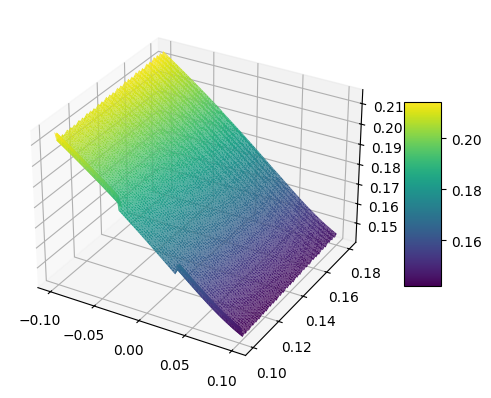

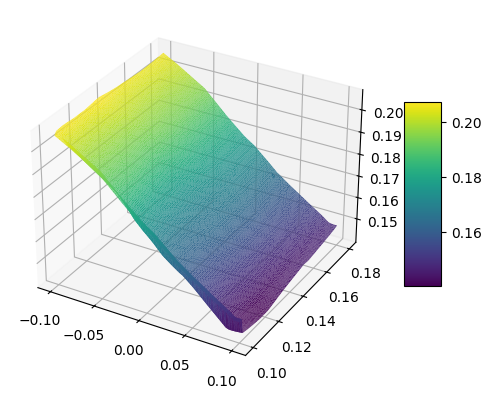

FileNotFoundError: [Errno 2] No such file or directory: 'data/csvs/predictions_singleprocessing.csv'

In [50]:
import matplotlib.pyplot as plt
surface_samples = pd.read_csv("data/csvs/heston_surface.csv")
ivnn = pd.read_csv("data/csvs/predictions_singleproccessing.csv")

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_trisurf(np.log(surface_samples["moneyness"][3:]), surface_samples["time_to_maturity"][3:], surface_samples["IV"][::-1], cmap="viridis")
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)  # Move this line here
plt.show()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_trisurf(np.log(surface_samples["moneyness"][3:]), surface_samples["time_to_maturity"][3:], ivnn["IV_NN"], cmap="viridis")
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)  # Move this line here
plt.show()

# compute relative error
ivnn = pd.read_csv("data/csvs/predictions_singleprocessing.csv")
iv = surface_samples["IV"]
iv_nn = ivnn["IV_NN"]
relative_error = (iv - iv_nn) / iv
print(relative_error.mean())




In [38]:
import importlib
import synthesizer
importlib.reload(synthesizer)

from synthesizer import synthesize_vanilla_options_optim_data


n_samples: int = 5*10**2
samples = synthesize_vanilla_options_optim_data(n_samples=n_samples)
samples.to_csv("data/csvs/heston_optim.csv", index=False)




2024-03-14 13:45:04,911 - INFO - RuntimeError: Intrinsic -0.04563441151479286. Time 0.0328792544212815. Strike 1.0456344115147929.
2024-03-14 13:45:06,079 - INFO - RuntimeError: Intrinsic -0.1030304148911998. Time 0.0548147705471809. Strike 1.1030304148911998.
2024-03-14 13:45:06,842 - INFO - RuntimeError: Intrinsic 0.06860064825298384. Time 0.1451757337647003. Strike 0.9313993517470162.


In [43]:
from tensorizer import tensorize
tensorize(data_frame=samples, save_name="Optim", split=False)

In [44]:
import torch

tensor_dict = torch.load("data/tensors/HestonUnsplitOptim.pt")

print(tensor_dict["x"].shape)
print(tensor_dict["y"].shape)

torch.Size([495, 7])
torch.Size([495])
